In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
from sklearn.ensemble import HistGradientBoostingRegressor as hgbr
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score as r2 
import shap

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Open the pickle file
df = pickle.load(open('../../data/processed/merged_data_202507062100_long.pkl', 'rb'))
df

,Time,ticker,Last,Volume,Change_Last,Change_Volume,Log_Volume,Log_Price,AAL_Change_Article Count_cum16_lag01,AAL_Change_Article Count_cum16_lag02,...,month_of_year_11,month_of_year_12,month_of_year_2,month_of_year_3,month_of_year_4,month_of_year_5,month_of_year_6,month_of_year_7,month_of_year_8,month_of_year_9
27,2018-01-03 09:45:00,AAL,52.299999,178545,-0.140,-77718,12.092602,3.975936,2,5,...,0,0,0,0,0,0,0,0,0,0
28,2018-01-03 10:00:00,AAL,52.389999,129775,0.090,-48770,11.773565,3.977623,7,2,...,0,0,0,0,0,0,0,0,0,0
29,2018-01-03 10:15:00,AAL,52.490002,57301,0.100,-72474,10.956091,3.979495,-1,7,...,0,0,0,0,0,0,0,0,0,0
30,2018-01-03 10:30:00,AAL,52.310001,874095,-0.180,816794,13.680945,3.976124,-2,-1,...,0,0,0,0,0,0,0,0,0,0
31,2018-01-03 10:45:00,AAL,52.230000,199000,-0.080,-675095,12.201065,3.974622,3,-2,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337962,2025-05-30 14:45:00,UAL,79.480003,144655,0.230,25287,11.882113,4.388009,-1,0,...,0,0,0,0,0,1,0,0,0,0
337963,2025-05-30 15:00:00,UAL,79.519997,169821,0.040,25166,12.042506,4.388505,-2,-1,...,0,0,0,0,0,1,0,0,0,0
337964,2025-05-30 15:15:00,UAL,79.910004,402686,0.390,232865,12.905915,4.393337,1,-2,...,0,0,0,0,0,1,0,0,0,0
337965,2025-05-30 15:30:00,UAL,79.760002,232344,-0.150,-170342,12.355979,4.391482,0,1,...,0,0,0,0,0,1,0,0,0,0


In [3]:
df.columns.tolist()

['Time',
 'ticker',
 'Last',
 'Volume',
 'Change_Last',
 'Change_Volume',
 'Log_Volume',
 'Log_Price',
 'AAL_Change_Article Count_cum16_lag01',
 'AAL_Change_Article Count_cum16_lag02',
 'AAL_Change_Article Count_cum16_lag03',
 'AAL_Change_Article Count_cum16_lag04',
 'AAL_Change_Article Count_cum16_lag05',
 'AAL_Change_Article Count_cum16_lag06',
 'AAL_Change_Article Count_cum16_lag07',
 'AAL_Change_Article Count_cum16_lag08',
 'AAL_Change_Article Count_cum16_lag09',
 'AAL_Change_Article Count_cum16_lag10',
 'AAL_Change_Article Count_cum16_lag11',
 'AAL_Change_Article Count_cum16_lag12',
 'AAL_Change_Article Count_cum16_lag13',
 'AAL_Change_Article Count_cum16_lag14',
 'AAL_Change_Article Count_cum16_lag15',
 'AAL_Change_Article Count_cum16_lag16',
 'AAL_Change_Article Count_cum16_lag17',
 'AAL_Change_Article Count_cum16_lag18',
 'AAL_Change_Article Count_cum16_lag19',
 'AAL_Change_Article Count_cum16_lag20',
 'AAL_Change_Article Count_cum16_lag21',
 'AAL_Change_Article Count_cum16_lag

In [12]:
[i for i in df.columns if 'Change_Volume' in i]

['Change_Volume',
 'AAL_Change_Volume_Day_lag01',
 'AAL_Change_Volume_Day_lag02',
 'AAL_Change_Volume_Day_lag03',
 'AAL_Change_Volume_Day_lag04',
 'AAL_Change_Volume_Day_lag05',
 'AAL_Change_Volume_Day_lag06',
 'AAL_Change_Volume_Day_lag07',
 'AAL_Change_Volume_Day_lag08',
 'AAL_Change_Volume_Day_lag09',
 'AAL_Change_Volume_Day_lag10',
 'AAL_Change_Volume_lag01',
 'AAL_Change_Volume_lag02',
 'AAL_Change_Volume_lag03',
 'AAL_Change_Volume_lag04',
 'AAL_Change_Volume_lag05',
 'AAL_Change_Volume_lag06',
 'AAL_Change_Volume_lag07',
 'AAL_Change_Volume_lag08',
 'AAL_Change_Volume_lag09',
 'AAL_Change_Volume_lag10',
 'AAL_Change_Volume_lag11',
 'AAL_Change_Volume_lag12',
 'AAL_Change_Volume_lag13',
 'AAL_Change_Volume_lag14',
 'AAL_Change_Volume_lag15',
 'AAL_Change_Volume_lag16',
 'AAL_Change_Volume_lag17',
 'AAL_Change_Volume_lag18',
 'AAL_Change_Volume_lag19',
 'AAL_Change_Volume_lag20',
 'AAL_Change_Volume_lag21',
 'AAL_Change_Volume_lag22',
 'AAL_Change_Volume_lag23',
 'AAL_Change_Volum

In [13]:
# Data preprocessing
df.sort_values(by=['Time','ticker'], inplace=True) # important so that we can split train/test by time

#y_cols = ['Change_Volume']
y_cols = ['Change_Volume']

#x_cols = [
#        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4',#'month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12','hour_of_day_9',#'hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
#        'is_open','is_close'
#        ]

x_cols = [i for i in df.columns if 'Change_Volume' in i and i != 'Change_Volume'] + [
        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4','month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12','hour_of_day_9','hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
        'is_open','is_close'
        ]

y = df[y_cols]
x = df[x_cols]
#x = df.copy()
#x.drop(columns=['ticker','Time','Last','Volume','Change_Last','Change_Volume','Log_Volume','Log_Price'], inplace=True)

In [14]:
[i for i in x.columns if 'lag' not in i]

['day_of_week_0',
 'day_of_week_1',
 'day_of_week_2',
 'day_of_week_3',
 'day_of_week_4',
 'month_of_year_1',
 'month_of_year_2',
 'month_of_year_3',
 'month_of_year_4',
 'month_of_year_5',
 'month_of_year_6',
 'month_of_year_7',
 'month_of_year_8',
 'month_of_year_9',
 'month_of_year_10',
 'month_of_year_11',
 'month_of_year_12',
 'hour_of_day_9',
 'hour_of_day_10',
 'hour_of_day_11',
 'hour_of_day_12',
 'hour_of_day_13',
 'hour_of_day_14',
 'hour_of_day_15',
 'is_open',
 'is_close']

In [16]:
# Train/test splitting
split_val  = round(0.7 * len(x))
split_test = round(0.9 * len(x))

x_train = x[:split_val]
x_val   = x[split_val:split_test]
x_test  = x[split_test:]

y_train = y[:split_val]
y_val   = y[split_val:split_test]
y_test  = y[split_test:]

In [17]:
# Normalize the features to [0,1]
sc2 = MinMaxScaler(feature_range=(0, 1))

x_train = sc2.fit_transform(x_train)
x_val   = sc2.transform(x_val)
x_test  = sc2.transform(x_test)

In [18]:
x_train.shape

(236445, 466)

In [19]:
model = hgbr(
    learning_rate=0.5,
    min_samples_leaf=500,
    l2_regularization=0,
    #max_features=0.1,
    max_features=1.0,
    max_leaf_nodes=None,
    max_depth=None,
    early_stopping=True,
    scoring='r2',
    n_iter_no_change=20,
    verbose=2,
    max_iter = 200,
    random_state=42
)

model.fit(x_train, y_train, 
          X_val=x_val, y_val=y_val)

Binning 0.881 GB of training data: 

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\sklearn\utils\validation.py:1406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\sklearn\utils\validation.py:1406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


2.527 s
Binning 0.252 GB of validation data: 0.258 s
Fitting gradient boosted rounds:
[1/200] 1 tree, 365 leaves, max depth = 46, train score: 0.17958, val score: 0.18555, in 0.605s
[2/200] 1 tree, 375 leaves, max depth = 47, train score: 0.25102, val score: 0.26010, in 0.599s
[3/200] 1 tree, 365 leaves, max depth = 44, train score: 0.28568, val score: 0.29154, in 0.598s
[4/200] 1 tree, 363 leaves, max depth = 43, train score: 0.29427, val score: 0.30617, in 0.593s
[5/200] 1 tree, 356 leaves, max depth = 50, train score: 0.30678, val score: 0.31690, in 0.692s
[6/200] 1 tree, 364 leaves, max depth = 49, train score: 0.31574, val score: 0.32469, in 0.607s
[7/200] 1 tree, 364 leaves, max depth = 51, train score: 0.32238, val score: 0.32759, in 0.595s
[8/200] 1 tree, 362 leaves, max depth = 62, train score: 0.32264, val score: 0.32996, in 0.589s
[9/200] 1 tree, 370 leaves, max depth = 61, train score: 0.32272, val score: 0.33267, in 0.591s
[10/200] 1 tree, 364 leaves, max depth = 68, train

,loss,'squared_error'
,quantile,None
,learning_rate,0.5
,max_iter,200
,max_leaf_nodes,None
,max_depth,None
,min_samples_leaf,500
,l2_regularization,0
,max_features,1.0
,max_bins,255
,categorical_features,'from_dtype'


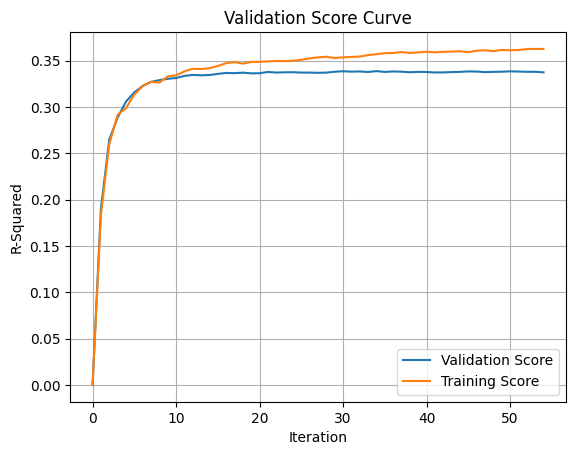

In [36]:
# Graph the training and validation loss
#plt.plot(model.loss_curve_)
plt.plot(model.validation_score_, label='Validation Score')
plt.plot(model.train_score_, label='Training Score')
plt.legend()
plt.grid()
plt.title('Validation Score Curve')
plt.xlabel('Iteration')
plt.ylabel('R-Squared')
plt.show()

In [37]:
model.score(x_val, y_val)

0.33750531320181265

In [38]:
model.score(x_test, y_test)

0.19927400166976306

In [39]:
model.score(x_train, y_train)

0.356605829581058

In [40]:
y_pred = model.predict(x_val)

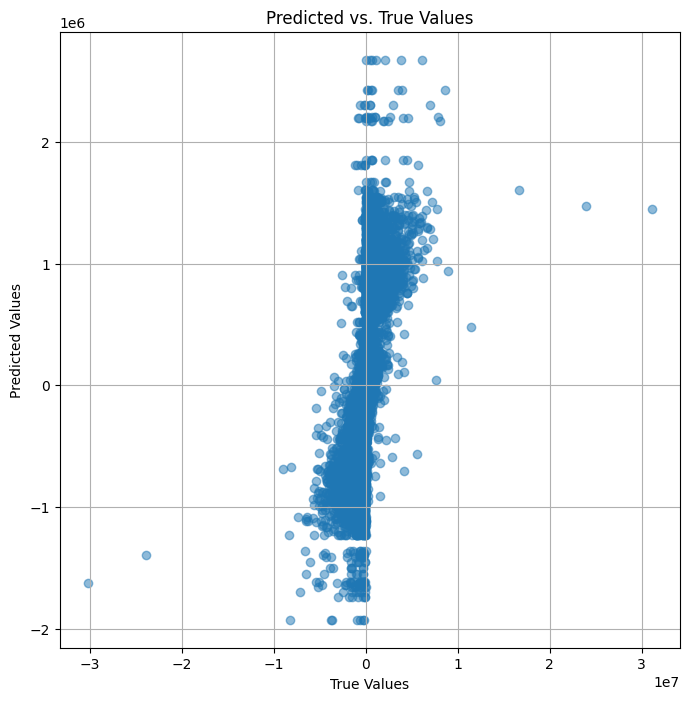

In [41]:
plt.figure(figsize=(8, 8))
plt.scatter(y_val, y_pred, alpha=0.5)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs. True Values")
plt.grid(True)
plt.show()

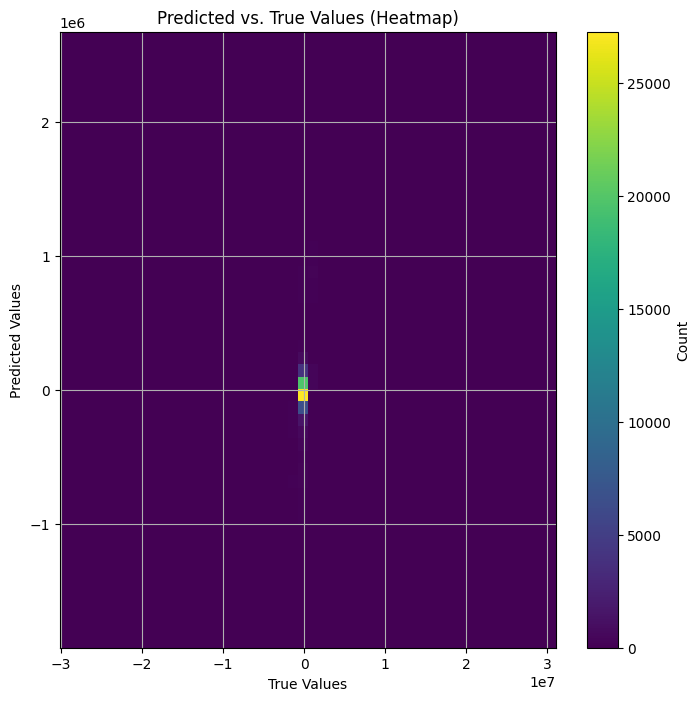

In [42]:
# Heatmap of predicted vs. true values
plt.figure(figsize=(8, 8))
# Convert to numpy arrays for hist2d
true_vals = y_val.values.flatten()
pred_vals = y_pred.flatten()

# Create heatmap using hist2d
h = plt.hist2d(true_vals, pred_vals, bins=50, cmap='viridis')
plt.colorbar(h[3], label='Count')

plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs. True Values (Heatmap)")
plt.grid(True)
plt.show()

In [26]:
y_val.iloc[:,0]

2023-03-08 14:30:00    0.0300
2023-03-08 14:45:00    0.0300
2023-03-08 15:00:00   -0.0100
2023-03-08 15:15:00   -0.0200
2023-03-08 15:30:00    0.0100
                        ...  
2024-08-30 11:00:00   -0.0551
2024-08-30 11:15:00   -0.0199
2024-08-30 11:30:00   -0.0450
2024-08-30 11:45:00   -0.0500
2024-08-30 12:00:00   -0.0150
Name: AAL_Change_Open, Length: 9656, dtype: float64

In [160]:
x_val[0]

array([3.66980068e-01, 4.93728607e-01, 5.01999073e-01, 3.73897218e-01,
       4.88884033e-01, 4.90049617e-01, 5.00306373e-01, 4.05262899e-01,
       4.19051083e-01, 3.95219446e-01, 4.61962683e-01, 4.96588018e-01,
       4.88916508e-01, 4.60406956e-01, 4.96140307e-01, 5.02901978e-01,
       4.50757348e-01, 4.51821663e-01, 5.15323990e-01, 4.26765505e-01,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 2.75440705e-01, 4.38356164e-01,
       3.82255639e-01, 3.85040374e-01, 3.96133094e-01, 3.82762487e-01,
       3.90296365e-01, 3.47617445e-01, 3.83356287e-01, 4.02591600e-01,
      

In [159]:
y_pred

array([  43233.00469993,  -66739.58639703,  -90750.87097692, ...,
        183471.05816173, -247595.83811078, -106768.80970552])

In [121]:
# random sample of x_val
x_sample = pd.DataFrame(x_val[np.random.choice(x_val.shape[0], 100, replace=False)], columns=x_cols)

kernel_explainer = shap.KernelExplainer(model.predict, x_sample, seed=1234)
shap_values = kernel_explainer(x_sample)

100%|██████████| 100/100 [02:16<00:00,  1.37s/it]


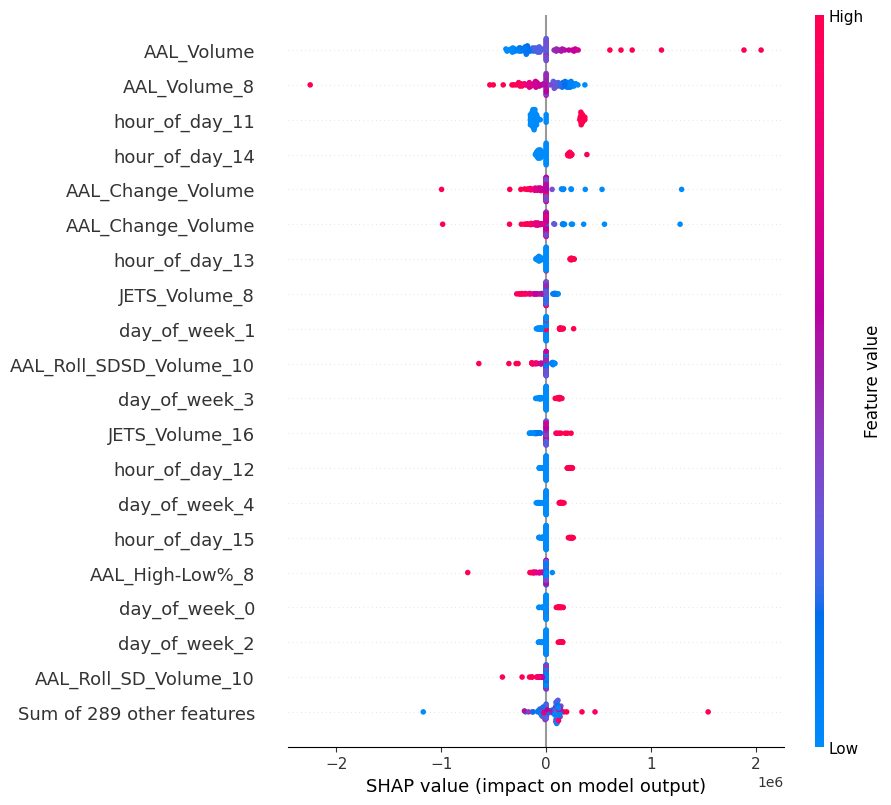

In [122]:
shap.plots.beeswarm(shap_values, max_display=20)